In [7]:
from google.colab import files
uploaded = files.upload()

Saving final_noise_audio.wav to final_noise_audio (2).wav


In [8]:
from IPython.display import Audio
Audio("final_noise_audio.wav")

Sample Rate: 16000 Hz
Duration: 81.11 seconds
Mean Amplitude: 0.00016, Std Dev: 0.39914


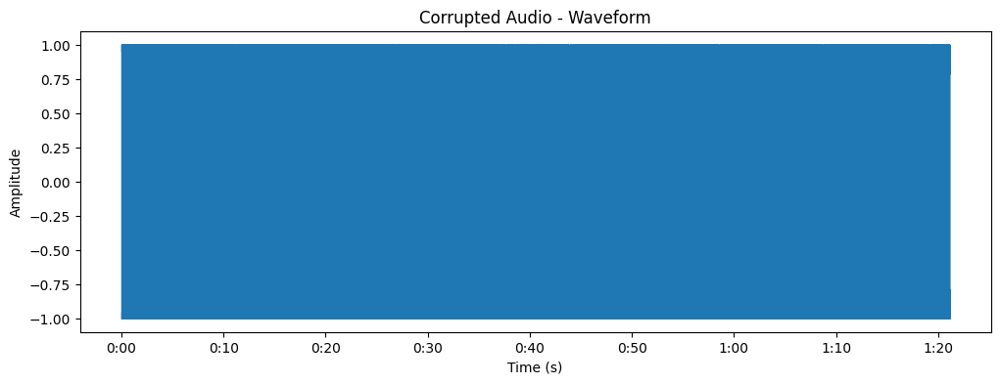

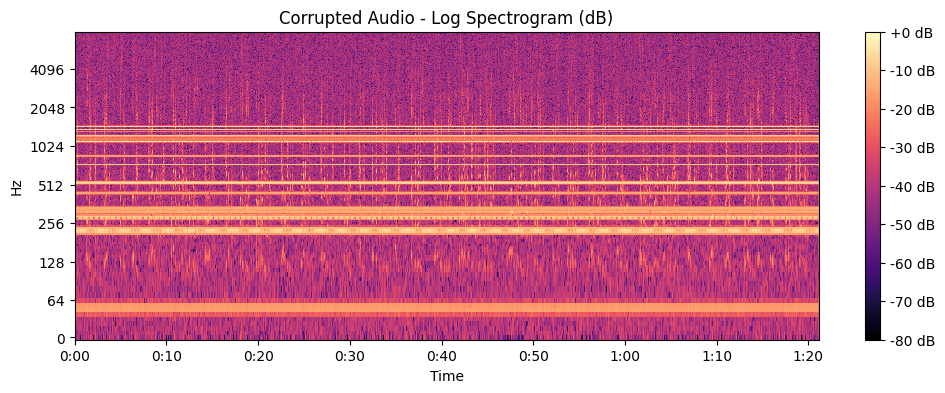

In [9]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

file = "final_noise_audio.wav"
audio, sr = librosa.load(file, sr=None)
duration = len(audio) / sr
print(f"Sample Rate: {sr} Hz")
print(f"Duration: {duration:.2f} seconds")
print(f"Mean Amplitude: {np.mean(audio):.5f}, Std Dev: {np.std(audio):.5f}")

plt.figure(figsize=(12, 4))
librosa.display.waveshow(audio, sr=sr)
plt.title("Corrupted Audio - Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

D = np.abs(librosa.stft(audio))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max), sr=sr,
                         x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format="%+2.0f dB")
plt.title("Corrupted Audio - Log Spectrogram (dB)")
plt.show()

In [10]:
pip install noisereduce

In [11]:
import noisereduce as nr
from scipy.signal import butter, lfilter
import soundfile as sf

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

filtered_audio = bandpass_filter(audio, 300, 3400, sr)

reduced_noise = nr.reduce_noise(y=filtered_audio, sr=sr)

sf.write("step2_denoised.wav", reduced_noise, sr)
print("Saved: step2_denoised.wav")

Audio("step2_denoised.wav")

Saved: step2_denoised.wav


Sample Rate: 16000 Hz
Duration: 81.11 seconds
Mean Amplitude: -0.00002, Std Dev: 0.02635


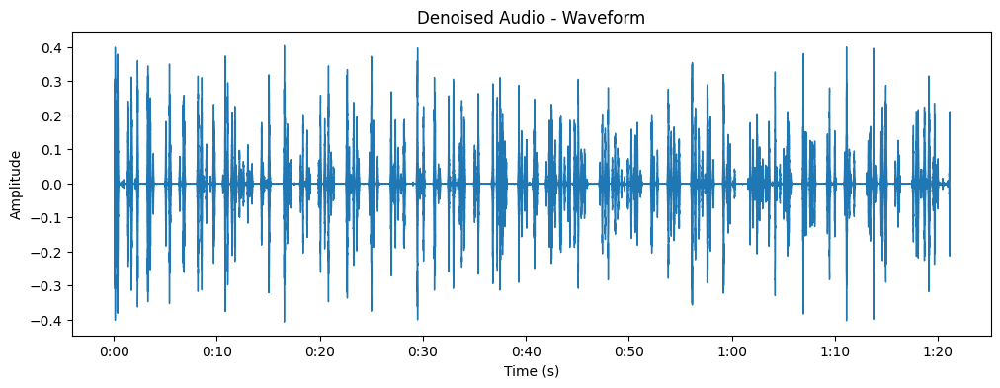

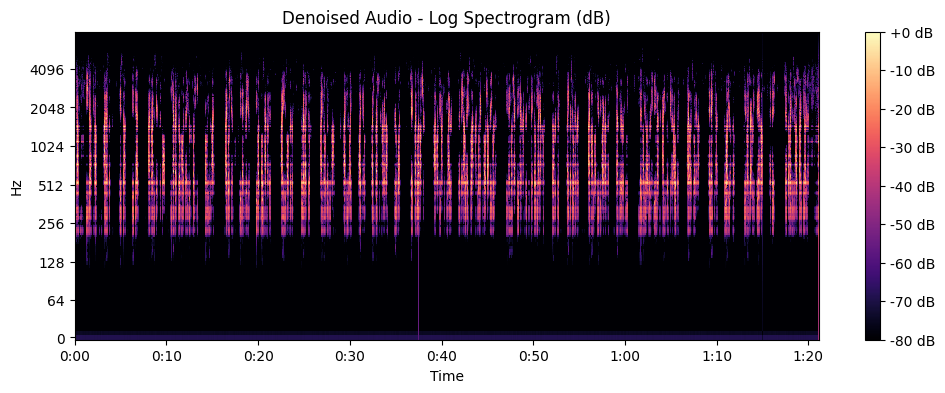

In [12]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

denoised_file = "step2_denoised.wav"
den_audio, den_sr = librosa.load(denoised_file, sr=None)

print(f"Sample Rate: {den_sr} Hz")
print(f"Duration: {len(den_audio)/den_sr:.2f} seconds")
print(f"Mean Amplitude: {np.mean(den_audio):.5f}, Std Dev: {np.std(den_audio):.5f}")

plt.figure(figsize=(12, 4))
librosa.display.waveshow(den_audio, sr=den_sr)
plt.title("Denoised Audio - Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

D_denoised = np.abs(librosa.stft(den_audio))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(D_denoised, ref=np.max), sr=den_sr,
                         x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format="%+2.0f dB")
plt.title("Denoised Audio - Log Spectrogram (dB)")
plt.show()

In [13]:
pip install speechbrain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 864.1/864.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.6/118.6 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.1/739.1 kB 37.0 MB/s eta 0:00:00


In [14]:
!pip install git+https://github.com/openai/whisper.git
!sudo apt-get install ffmpeg

  Cloning https://github.com/openai/whisper.git to /tmp/pip-req-build-kdqmv9ti
  Running command git clone --filter=blob:none --quiet https://github.com/openai/whisper.git /tmp/pip-req-build-kdqmv9ti
  Resolved https://github.com/openai/whisper.git to commit c0d2f624c09dc18e709e37c2ad90c039a4eb72a2
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for openai-whisper: filename=openai_whisper-20250625-py3-none-any.whl size=803979 sha256=1258f591f5cd7283f4807860c50528a5af48a673fb95e1d7d8c9ff33cbc80099
  Stored in directory: /tmp/pip-ephem-wheel-cache-4xluzmof/wheels/1f/1d/98/9583695e6695a6ac0ad42d87511097dce5ba486647dbfecb0e
Successfully built openai-whisper
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [15]:
import whisper

model = whisper.load_model("base")

files = ["step2_denoised.wav"]

for f in files:
    result = model.transcribe(f)
    print(f"Transcription for {f}:")
    print(result["text"])

100%|████████████████████████████████████████| 139M/139M [00:01<00:00, 112MiB/s]
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcription for step2_denoised.wav:
 I think he's just a cop. I messed up. His gun is dead. I tried to scare him, but it's all... He can't threat to Bill Paul. It's a different body. Probably even the right one. I approached him. He's head in the ring here. He wants to post half my death. I think he's all pervert. The red light's still. I didn't know it was making a sound. I think the light's still. I just brushed him. I'm right back. He was watching. I bloodmossed. I fought behind him for the library. He was saying, I'll leave a useless laugh. I'll be going next to the lower shop for you. We've been one check since the day of the 9th, where he's been smoking. Bill came out of the corner. So, over six, the 8th or still, I talked about him three times, but half the number of weeks. He said something about a quarter of the 8th reading last night. I think it's the same thing that I hope for. I know that it's going everywhere. And any time you haven't. We want you, yourself. He said, min

In [16]:
!pip install git+https://github.com/haoheliu/voicefixer
!pip install soundfile librosa

  Cloning https://github.com/haoheliu/voicefixer to /tmp/pip-req-build-up57h69i
  Running command git clone --filter=blob:none --quiet https://github.com/haoheliu/voicefixer /tmp/pip-req-build-up57h69i
  Resolved https://github.com/haoheliu/voicefixer to commit aae2253c85f97a87b844b6832384de249c23ab37
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 7.4 MB/s eta 0:00:00
  Created wheel for voicefixer: filename=voicefixer-0.1.2-py3-none-any.whl size=51867 sha256=526083ebf7626c9dc0c40c56d8be33917d9c01d9d86c53845ff66624c7a4d41d
  Stored in directory: /tmp/pip-ephem-wheel-cache-94yjilob/wheels/6f/80/1f/0724d8ee6338b3b3ae019518c84e696caf8d6625a6becdeee5
  Created wheel for

In [17]:
import torch
from voicefixer import VoiceFixer
from IPython.display import Audio
import soundfile as sf

vf = VoiceFixer()

input_file = "final_noise_audio.wav"
output_file = "VoiceFixer_denoised.wav"

vf.restore(
    input=input_file,
    output=output_file,
    cuda=False
)

print("Saved:", output_file)

Audio(output_file)

Weights downloaded in: /root/.cache/voicefixer/synthesis_module/44100/model.ckpt-1490000_trimed.pt Size: 135613039
Weights downloaded in: /root/.cache/voicefixer/analysis_module/checkpoints/vf.ckpt Size: 489307071
Saved: VoiceFixer_denoised.wav


Sample Rate: 44100 Hz
Duration: 81.11 seconds
Mean Amplitude: 0.00052, Std Dev: 0.10688


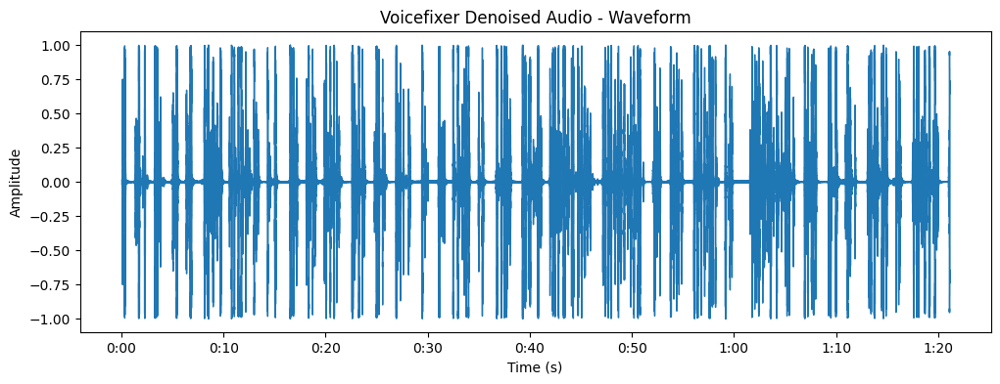

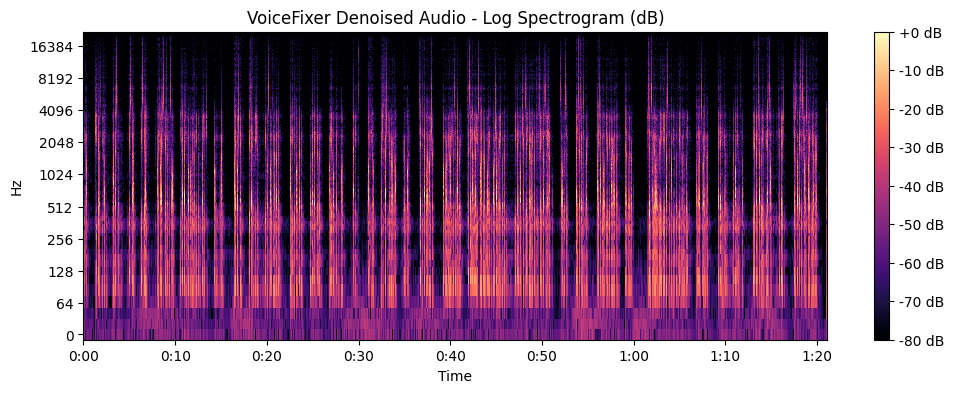

In [19]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

denoised_file = "VoiceFixer_denoised.wav"
den_audio, den_sr = librosa.load(denoised_file, sr=None)

print(f"Sample Rate: {den_sr} Hz")
print(f"Duration: {len(den_audio)/den_sr:.2f} seconds")
print(f"Mean Amplitude: {np.mean(den_audio):.5f}, Std Dev: {np.std(den_audio):.5f}")

plt.figure(figsize=(12, 4))
librosa.display.waveshow(den_audio, sr=den_sr)
plt.title("Voicefixer Denoised Audio - Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

D_denoised = np.abs(librosa.stft(den_audio))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(D_denoised, ref=np.max), sr=den_sr,
                         x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format="%+2.0f dB")
plt.title("VoiceFixer Denoised Audio - Log Spectrogram (dB)")
plt.show()

In [18]:
import whisper

model = whisper.load_model("large")

files = ["VoiceFixer_denoised.wav"]

for f in files:
    result = model.transcribe(f)
    print(f"Transcription for {f}:")
    print(result["text"])

100%|█████████████████████████████████████| 2.88G/2.88G [00:51<00:00, 59.9MiB/s]
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcription for VoiceFixer_denoised.wav:
 pick up. She just picked up. My best friend. He's done. He's dead. I tried to scare him with a sword. He kept fighting through, probably with a gun, probably with a gun. I approached him. He's had the ratio. He wasn't supposed to have it like that. I think his father prepared for it. The red light was still pretty. I didn't know if the blanket was fogged. I think it was. I figured out that she's a flesh because of my body. Girl, what? She had to fight the law about her shirt. I'm part of the 300-year-old city library. Since they found me, I used blood and I did what I could. Power shop, very important. If you think one check the city can't identify clergy from Spain, they'll see my capital. So I said. The place is still separate. I thought we both viewed the prior routes better than the river. You said something about over being really fast when packing a full-to-date appointment with me. I don't like to see more than that. And then you can g